<a href="https://colab.research.google.com/github/vlozg/aicovid/blob/main/%5BExplore002%5D_AICOVID_115M.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook này nhằm mục đích trực quan và khám phả, thử ***augmentation***.

# Detect COVID-19 patients via forced-cough cell phone recording

- **Bài toán**: Nhận diện người nhiễm COVID-19 qua tiếng ho ép buộc
    - **Input**: Đoạn ghi âm tiếng ho, tuổi và giới tính
    - **Output**: Phân loại người nhiễm bệnh hay không

## Tìm hiểu bài toán 
Qua paper (https://dspace.mit.edu/bitstream/handle/1721.1/128954/09208795.pdf?sequence=1&isAllowed=y)

# Các biến thiết lập cho thử nghiệm

In [ ]:
val_split = 0.8

In [ ]:
forced_sr = 8000 # -1 mean not enforced
n_mfcc_ceptrum = 24
n_delta_features = 1
n_mfcc_features = n_mfcc_ceptrum * (1+n_delta_features)
n_mfcc_features

48

# Import và cài đặt thư viện

In [ ]:
# cài lib. note: cài xong phải restart runtime
try:
  import torchaudio
except ImportError:
  !pip install torchaudio
  !pip install pytorch-lightning
  !pip install --upgrade matplotlib
  exit()

In [ ]:
# Quản lý file, folder
import os

# Xử lý audio
import librosa

# Hiện audio nghe thử
import IPython.display as ipd
from IPython.display import Audio, display

from tqdm import tqdm

import random
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

import torchaudio
import pytorch_lightning as pl
pl.utilities.seed.seed_everything(seed=1)

Global seed set to 1


1

# Tải dữ liệu

In [ ]:
#@markdown Tải dữ liệu
%%capture
# download public train data
# official link: https://drive.google.com/file/d/1MPhz3zYl2yefCq-J5XySbFJt99BfKIZD/view
# personal link: https://drive.google.com/file/d/1hoGLxjLmPY-pX-jSVGIaWIZhovQBMKU1/view?usp=sharing
if not os.path.isfile('./aicv115m_public_train.zip'):
  !gdown --id 1MPhz3zYl2yefCq-J5XySbFJt99BfKIZD
  !unzip -o aicv115m_public_train.zip

# dowload public test data
# official link: https://drive.google.com/file/d/1UrMudzopA3CyR1Ih2J63Kfi2mY_0uhRK/view
# personal link: https://drive.google.com/file/d/1X7vOjHos9f9w48-iTWyu5JElFqCjcH_R/view?usp=sharing
if not os.path.isfile('./aicv115m_public_test.zip'):
  !gdown --id 1UrMudzopA3CyR1Ih2J63Kfi2mY_0uhRK
  !unzip -o aicv115m_public_test.zip

# Setup thư mục chứa data và đọc meta

In [ ]:
#@markdown Giải nén data
%%capture
!unzip -n aicv115m_public_train/train_audio_files_8k.zip
!unzip -n aicv115m_public_test/public_test_audio_files_8k.zip

train_path = 'train_audio_files_8k/'
test_path = 'public_test_audio_files_8k/'

In [ ]:
print(f'Train path: {train_path}')
print(f'Test path: {test_path}')

Train path: train_audio_files_8k/
Test path: public_test_audio_files_8k/


In [ ]:
#@markdown Đọc meta
train_meta = pd.read_csv('aicv115m_public_train/metadata_train_challenge.csv')
train_meta['file_path'] = train_path+train_meta['file_path']
test_meta = pd.read_csv('aicv115m_public_test/metadata_public_test.csv')
test_meta['file_path'] = test_path+test_meta['file_path']

In [ ]:
display(train_meta.shape)
train_meta.head()

(1199, 5)

,uuid,subject_gender,subject_age,assessment_result,file_path
0,3284bcf1-2446-4f3a-ac66-14c76b294177,male,23.0,0,train_audio_files_8k/3284bcf1-2446-4f3a-ac66-1...
1,431334e1-5946-4576-bb51-8e342ccc22b4,NaN,NaN,0,train_audio_files_8k/431334e1-5946-4576-bb51-8...
2,1d6fac4b-1e7f-4bdc-81cd-3a720bfbb1e1,NaN,NaN,0,train_audio_files_8k/1d6fac4b-1e7f-4bdc-81cd-3...
3,c7ee0695-b2e7-4beb-b904-f1455c9609d9,male,49.0,0,train_audio_files_8k/c7ee0695-b2e7-4beb-b904-f...
4,dd541704-b696-4181-8fd8-816daac0fcf9,NaN,NaN,0,train_audio_files_8k/dd541704-b696-4181-8fd8-8...


In [ ]:
display(test_meta.shape)
test_meta.head()

(350, 4)

,uuid,subject_gender,subject_age,file_path
0,66ef1f05-fbb0-44cb-8bdb-8eb4df83359a,female,28.0,public_test_audio_files_8k/66ef1f05-fbb0-44cb-...
1,73d13a12-f9bc-4554-af49-be24f6024a25,NaN,NaN,public_test_audio_files_8k/73d13a12-f9bc-4554-...
2,d27dbe98-e061-4018-9900-d1f1d47feab1,NaN,NaN,public_test_audio_files_8k/d27dbe98-e061-4018-...
3,43c30e4c-5d35-4ebc-8235-8920b7688550,female,NaN,public_test_audio_files_8k/43c30e4c-5d35-4ebc-...
4,1952aa84-d077-495d-a1a9-9686a30722e0,female,NaN,public_test_audio_files_8k/1952aa84-d077-495d-...


# Hàm xử lý âm thanh

Các hàm vỏ bọc cho đọc file

In [ ]:
#@markdown ## Các hàm vỏ bọc cho đọc file
#@markdown `read_audio(path)`: vỏ bọc cho `torchaudio.load(path)`.<br>
#@markdown `read_resample_audio(path)`: chỉ trả về wave vì sample rate đã được cố định.

'''
  Read audio from given path and return (wave, sample_rate)
'''
def read_audio(full_audio_path):
  return torchaudio.load(full_audio_path)

'''
  Read audio from given path, then resample if sample rate is not matched 
  and return wave.

  Tips: 
    you should provide resampler from torchaudio.transform
    when batch resampling with same params since this can
    give a huge speed up.
'''
def read_resample_audio(
    full_audio_path, resample,
    resampler=None
):
  wave, sr = torchaudio.load(full_audio_path)
  if resampler is not None:
      wave = resampler(wave)
  elif sr != resample:
      wave = torchaudio.functional.resample(wave, sr, resample)
  return wave

In [ ]:
# Spectrogram transformation
n_fft = 2048
win_length = 160
hop_length = 80
n_mels = 200
n_mfcc = 200

In [ ]:
#@markdown `spectrogram(waveform)` --> spec 
spectrogram = torchaudio.transforms.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    normalized=True,
    pad_mode="reflect",
    power=2.0,
)

#@markdown `mel_spectrogram(waveform)` --> mel_spec 
mel_spectrogram = torchaudio.transforms.MelSpectrogram(
    sample_rate=8000,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    #norm='slaney',
    onesided=True,
    normalized=True,
    n_mels=n_mels,
    mel_scale="htk",
)

#@markdown `log_spectrogram(spec)` --> log(spec)
log_spectrogram = torchaudio.transforms.AmplitudeToDB(
    stype='power',
    top_db=80
)

In [ ]:
#@markdown `mfcc_transform(waveform)` --> MFCC

mfcc_transform = torchaudio.transforms.MFCC(
    sample_rate=8000,
    n_mfcc=n_mfcc,
    log_mels=True,
    melkwargs={
      'n_fft': n_fft,
      'n_mels': n_mels,
      'hop_length': hop_length,
      'win_length': win_length,
      'normalized': True,
      'mel_scale': 'htk'
    }
)

#@markdown `delta_transform(mfcc_transform(waveform))` --> delta MFCC

delta_transform = torchaudio.transforms.ComputeDeltas(
    win_length = 5, 
    mode = 'replicate'
)

In [ ]:
#@markdown `griffin_lim(spec)` --> waveform
griffin_lim = torchaudio.transforms.GriffinLim(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length
)

In [ ]:
#@markdown `StandardScaler()`
class StandardScaler(torch.nn.Module):
    def __init__(self) -> None:
        super(StandardScaler, self).__init__()
        
    def forward(self, spec: torch.Tensor) -> torch.Tensor:
        return ((spec-spec.mean())/spec.std()).nan_to_num(posinf=0.0, neginf=0.0)

#@markdown `MinMaxScaler()`
class MinMaxScaler(torch.nn.Module):
    def __init__(self) -> None:
        super(MinMaxScaler, self).__init__()
        
    def forward(self, spec: torch.Tensor) -> torch.Tensor:
        return ((spec-spec.min())/(spec.max()-spec.min())).nan_to_num(posinf=0.0, neginf=0.0)

# Khám phá dữ liệu

## Khám phá thiếu

In [ ]:
train_meta.isna().sum()/train_meta.shape[0]

uuid                 0.000000
subject_gender       0.423686
subject_age          0.461218
assessment_result    0.000000
file_path            0.000000
dtype: float64

In [ ]:
test_meta.isna().sum()/test_meta.shape[0]

uuid              0.000000
subject_gender    0.271429
subject_age       0.300000
file_path         0.000000
dtype: float64

## Khám phá phân lớp

In [ ]:
train_meta['assessment_result'].value_counts()

0    737
1    462
Name: assessment_result, dtype: int64

# Các hàm bổ trợ trực quan

In [ ]:
[width, height] = matplotlib.rcParams['figure.figsize']
if width < 10:
  matplotlib.rcParams['figure.figsize'] = [width * 2.5, height]

In [ ]:
#@markdown Vẽ specgram (specgram chỉ đơn giản là apply discrete-time Fourier transform)
#@markdown `plot_specgram(wave, sr, title, xlim, ylim)`
def plot_specgram(waveform, sample_rate, fig=None, title="Spectrogram", xlim=None):
  
  # Chuẩn hóa dữ liệu khi input có thể có 1 hoặc 2 chiều, với chiều 0 là channel
  if len(waveform.shape) == 1:
    num_channels = 1
    num_frames = waveform.shape[0]
    _waveform = [waveform]
  elif len(waveform.shape) == 2:
    num_channels, num_frames = waveform.shape
    _waveform = waveform
  
  time_axis = torch.arange(0, num_frames) / sample_rate

  # Khởi tạo subplot
  if fig is None:
    fig, axs = plt.subplots(num_channels, 1)
  else:
    axs = fig.subplots(num_channels, 1)

  # Chuẩn hóa axs vì 1 channel subplot không return list
  if num_channels == 1:
    axs = [axs]

  # Plot specgram for each channel
  for i in range(num_channels):
    axs[i].specgram(waveform[i], Fs=sample_rate)
    if xlim:
      axs[i].set_xlim(xlim)
  
  fig.suptitle(title)

In [ ]:
#@markdown Vẽ waveform `plot_waveform(wave, sr, fig, title, xlim, ylim)`
def plot_waveform(waveform, sample_rate, fig=None, title="Waveform", xlim=None, ylim=None):

  # Chuẩn hóa dữ liệu khi input có thể có 1 hoặc 2 chiều, với chiều 0 là channel
  if len(waveform.shape) == 1:
    num_channels = 1
    num_frames = waveform.shape[0]
    _waveform = [waveform]
  elif len(waveform.shape) == 2:
    num_channels, num_frames = waveform.shape
    _waveform = waveform
  
  time_axis = torch.arange(0, num_frames) / sample_rate

  # Khởi tạo subplot
  if fig is None:
    fig, axs = plt.subplots(num_channels, 1)
  else:
    axs = fig.subplots(num_channels, 1)

  # Chuẩn hóa axs vì 1 channel subplot không return list
  if num_channels == 1:
    axs = [axs]

  # Plot waveform
  for i in range(num_channels):
    axs[i].plot(time_axis, waveform[i], linewidth=1)
    axs[i].grid(True)
    if xlim:
      axs[i].set_xlim(xlim)
    if ylim:
      axs[i].set_ylim(ylim)
  
  fig.suptitle(title)

In [ ]:
#@markdown Vẽ spectrogram `plot_spectrogram(spec, fig, axs, title, ylabel, aspect, xmax, to_db)`
def plot_spectrogram(spec, fig=None, title=None, ylabel='freq_bin', aspect='auto', xmax=None, to_db=True):
  
  # Chuẩn hóa dữ liệu khi input có thể có 1 hoặc 2 chiều, với chiều 0 là channel
  if len(spec.shape) == 2:
    num_channels = 1
    _spec = [spec]
  elif len(spec.shape) == 3:
    num_channels = spec.shape[0]
    _spec = spec

  # Khởi tạo subplot
  if fig is None:
    fig, axs = plt.subplots(num_channels, 1)
  else:
    axs = fig.subplots(num_channels, 1)

  # Chuẩn hóa axs vì 1 channel subplot không return list
  if num_channels == 1:
    axs = [axs]

  fig.suptitle(title or 'Spectrogram (db)')

  for i in range(num_channels):
    axs[i].set_ylabel(ylabel)
    axs[i].set_xlabel('frame')
    im = axs[i].imshow(log_spectrogram(_spec[i]) if to_db else _spec[i], 
                       origin='lower', 
                       aspect=aspect)
    if xmax:
      axs[i].set_xlim((0, xmax))
  
  fig.colorbar(im, ax=axs)

In [ ]:
#@markdown Hiển thị audio box `play_audio(wave, sr)`
def play_audio(waveform, sample_rate):

  if len(waveform.shape) == 1:
    display(Audio(waveform, rate=sample_rate))
    return
  
  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

#@markdown Hiển thị audio box `play_audio_from_spec(spec, sample_rate)`
def play_audio_from_spec(spec, sample_rate):
  waveform = griffin_lim(spec)

  play_audio(waveform, sample_rate)

Hàm lấy mẫu data random

In [ ]:
def get_covid_samples(n_samples):
  df = train_meta[train_meta['assessment_result'] == 1]
  idxs = random.sample(range(len(df)), n_samples)
  return df.iloc[idxs]

def get_nocovid_samples(n_samples):
  df = train_meta[train_meta['assessment_result'] == 0]
  idxs = random.sample(range(len(df)), n_samples)
  return df.iloc[idxs]

# Khám phá âm thanh

In [ ]:
n_samples = 3

In [ ]:
#@markdown Đọc `n_samples` mẫu audio cho mỗi class
sample_noCOVID_files = get_nocovid_samples(n_samples)['file_path']
sample_COVID_files = get_covid_samples(n_samples)['file_path']

sample_noCOVIDs = []
sample_COVIDs = []

for file in sample_noCOVID_files:
  wave, sr = read_audio(file)
  sample_noCOVIDs.append({'wave': wave, 'sr': sr})

for file in sample_COVID_files:
  wave, sr = read_audio(file)
  sample_COVIDs.append({'wave': wave, 'sr': sr})

Sample 0, Size (torch.Size([1, 47520])):


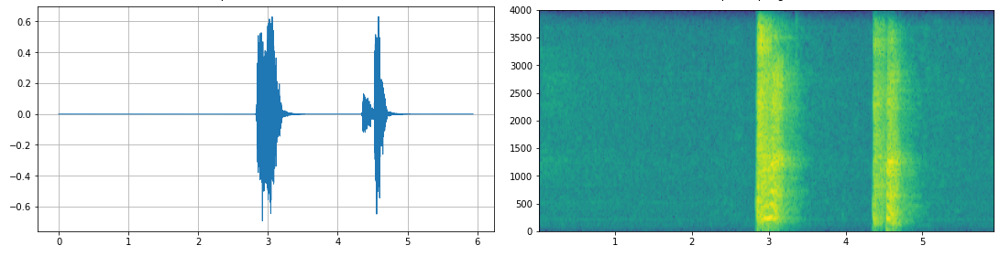

Sample 1, Size (torch.Size([1, 78720])):


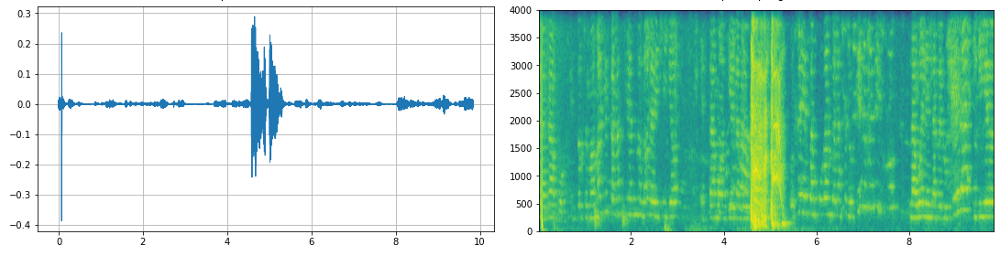

Sample 2, Size (torch.Size([1, 77280])):


/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


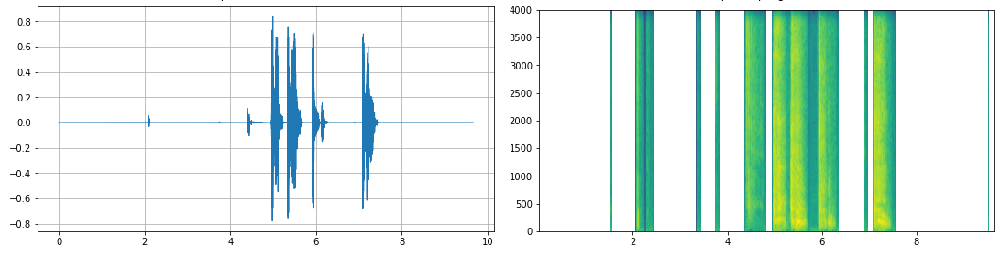

In [ ]:
#@markdown ## Các mẫu audio không COVID
for idx, a in enumerate(sample_noCOVIDs):
  print(f'Sample {idx}, Size ({a["wave"].shape}):')
  fig = plt.figure(constrained_layout=True)
  subfigs = fig.subfigures(1, 2).flat
  
  play_audio(a['wave'], a['sr'])
  plot_waveform(a['wave'], a['sr'], subfigs[0], title=f'Sample {idx} waveform')
  plot_specgram(a['wave'], a['sr'], subfigs[1], title=f'Sample {idx} specgram')
  plt.show(block=False)

Sample 0, Size (torch.Size([1, 78720])):


/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


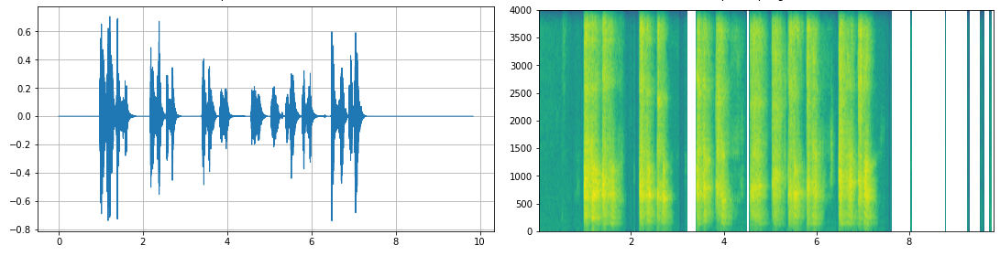

Sample 1, Size (torch.Size([1, 78720])):


/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


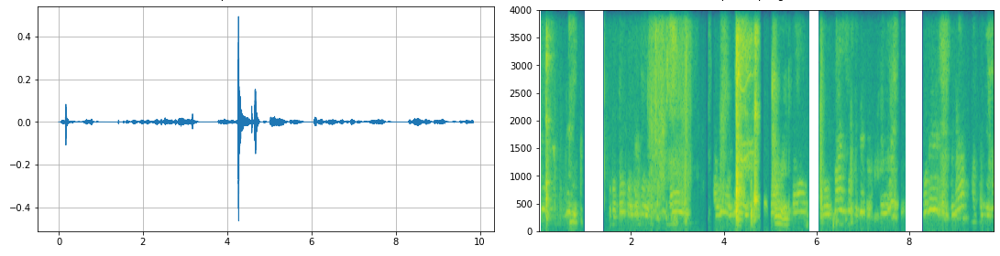

Sample 2, Size (torch.Size([1, 48960])):


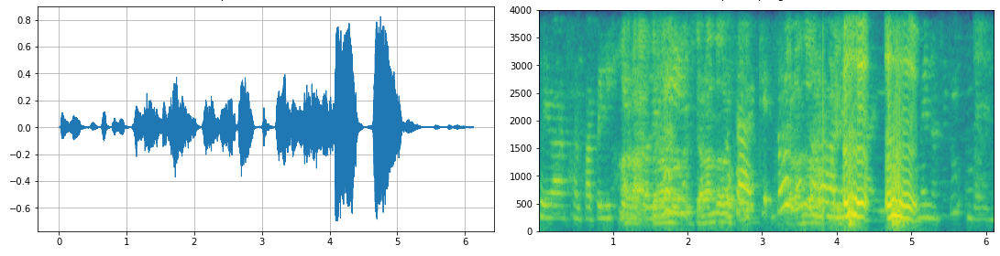

In [ ]:
#@markdown ## Các mẫu audio có COVID
for idx, a in enumerate(sample_COVIDs):
  print(f'Sample {idx}, Size ({a["wave"].shape}):')
  fig = plt.figure(constrained_layout=True)
  subfigs = fig.subfigures(1, 2).flat
  
  play_audio(a['wave'], a['sr'])
  plot_waveform(a['wave'], a['sr'], subfigs[0], title=f'Sample {idx} waveform')
  plot_specgram(a['wave'], a['sr'], subfigs[1], title=f'Sample {idx} specgram')
  plt.show(block=False)

torch.Size([1, 1025, 595])
torch.Size([1, 1025, 985])
torch.Size([1, 1025, 967])
torch.Size([1, 1025, 985])
torch.Size([1, 1025, 985])
torch.Size([1, 1025, 613])


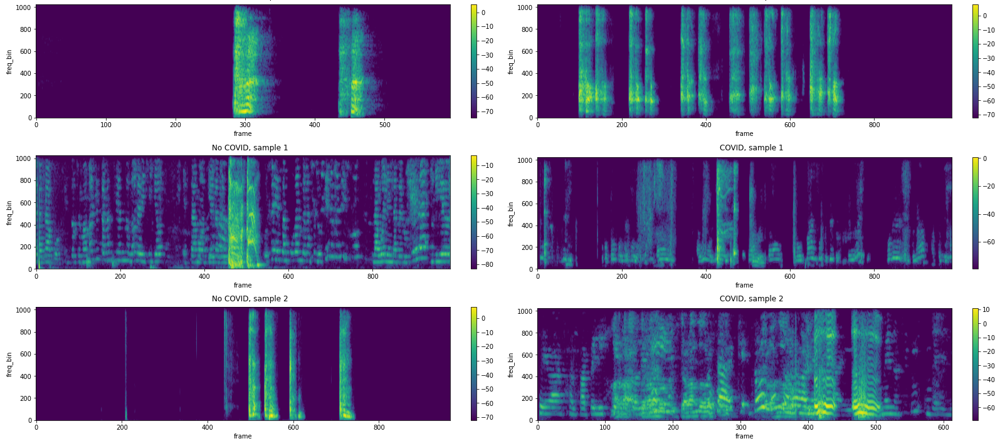

In [ ]:
#@markdown ## So sánh spectrogram
fig = plt.figure(constrained_layout=True, figsize=(22, 10))
subfigs = fig.subfigures(n_samples, 2)

for i, sample in enumerate(sample_noCOVIDs):
  spec = spectrogram(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 0], f'No COVID, sample {i}')
for i, sample in enumerate(sample_COVIDs):
  spec = spectrogram(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 1], f'COVID, sample {i}')

fig.show()

torch.Size([1, 200, 595])
torch.Size([1, 200, 985])
torch.Size([1, 200, 967])
torch.Size([1, 200, 985])
torch.Size([1, 200, 985])
torch.Size([1, 200, 613])


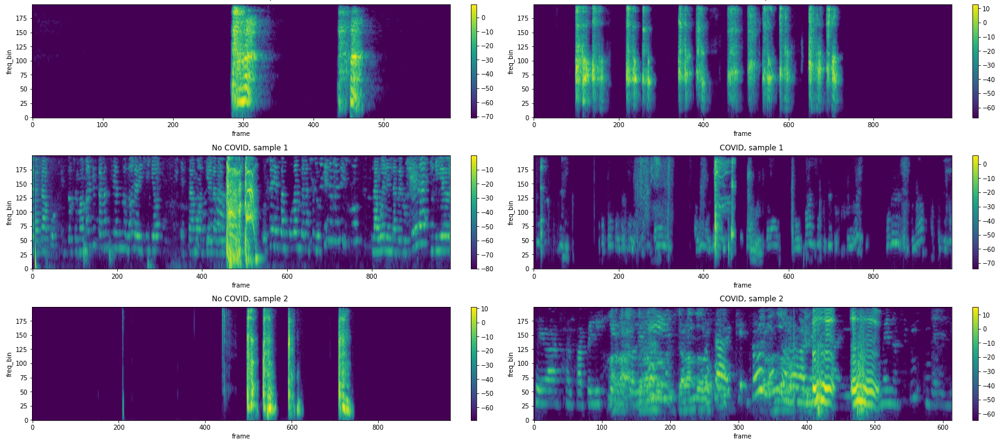

In [ ]:
#@markdown ## So sánh mel spectrogram
fig = plt.figure(constrained_layout=True, figsize=(22, 10))
subfigs = fig.subfigures(n_samples, 2)

for i, sample in enumerate(sample_noCOVIDs):
  spec = mel_spectrogram(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 0], f'No COVID, sample {i}')
for i, sample in enumerate(sample_COVIDs):
  spec = mel_spectrogram(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 1], f'COVID, sample {i}')

fig.show()

torch.Size([1, 200, 595])
torch.Size([1, 200, 985])
torch.Size([1, 200, 967])
torch.Size([1, 200, 985])
torch.Size([1, 200, 985])
torch.Size([1, 200, 613])


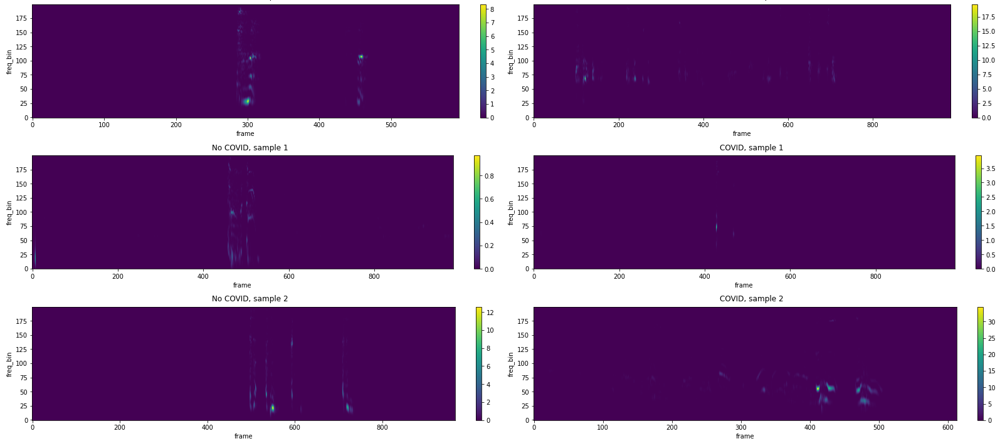

In [ ]:
#@markdown ## So sánh mel spectrogram (độ đo amplitude)
fig = plt.figure(constrained_layout=True, figsize=(22, 10))
subfigs = fig.subfigures(n_samples, 2)

for i, sample in enumerate(sample_noCOVIDs):
  spec = mel_spectrogram(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 0], f'No COVID, sample {i}', to_db=False)
for i, sample in enumerate(sample_COVIDs):
  spec = mel_spectrogram(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 1], f'COVID, sample {i}', to_db=False)

fig.show()

In [ ]:
#@markdown ## So sánh MFCC
fig = plt.figure(constrained_layout=True, figsize=(22, 10))
subfigs = fig.subfigures(n_samples, 2)

for i, sample in enumerate(sample_noCOVIDs):
  spec = mfcc_transform(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 0], f'No COVID, sample {i}')
for i, sample in enumerate(sample_COVIDs):
  spec = mfcc_transform(sample['wave'])
  print(spec.size())
  plot_spectrogram(spec, subfigs[i, 1], f'COVID, sample {i}')

fig.show()

Nhận xét: cân nhắc dùng mel spectrogram thay vì MFCC vì MFCC trông khá khó hiểu.

# Làm giàu dữ liệu (augmentation)

Lưu ý 1:

> We also introduce the learning
rate schedules we use to train the networks, as they turn out
to be an important factor in determining performance.

(from [SpecAugment paper](https://arxiv.org/pdf/1904.08779.pdf))

Lưu ý 2: do hầu hết augment đều thực hiện trên CPU và numpy, nên augment cho GPU mình sẽ để tương lai xem xét (khi mình hoàn thiện tổng thể và cần cải thiện tốc độ)

## Chunking with overlap
Dữ liệu gốc thường chứa nhiều tiếng ho. Việc lấy ra các đoạn nhỏ giúp tăng kích thước dữ liệu lên rất nhiều, lại còn có thể đạt được kỹ thuật shifting miễn phí :v. Và cuối cùng là có thể đảm bảo dữ liệu đầu vào có kích thước giống nhau.

In [ ]:
spec = mfcc_transform(sample_noCOVIDs[2]['wave'])[0]
spec = (spec - spec.mean())/spec.std()
chunk_size = 300
chunk_step = 100
pad_size = chunk_size - spec.size()[1]%chunk_size
pad_size = (pad_size//2, pad_size//2+pad_size%2)
padded_spec = torch.nn.functional.pad(spec, pad_size, mode='constant', value=0)
chunks = padded_spec.unfold(1, chunk_size, chunk_step).permute(1,0,2)
chunks

tensor([[[  0.0000,   0.0000,   0.0000,  ..., -14.8920, -14.8920, -14.8920],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703]],

        [[  0.0000,   0.0000,   0.0000,  ..., -14.8920, -14.8920, -14.8920],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         ...,
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703],
         [  0.0000,   0.0000,   0.0000,  ...,   0.0703,   0.0703,   0.0703]],

        [[-14.8920, -14.8920, -14.8920,  ...

In [ ]:
display(chunks.size())
display(chunks.max())
display(chunks.min())
display(chunks.mean())

torch.Size([10, 200, 300])

tensor(3.9081)

tensor(-14.8920)

tensor(0.0003)

0

tensor(0.2064)

tensor(-14.8920)

tensor(-0.0028)

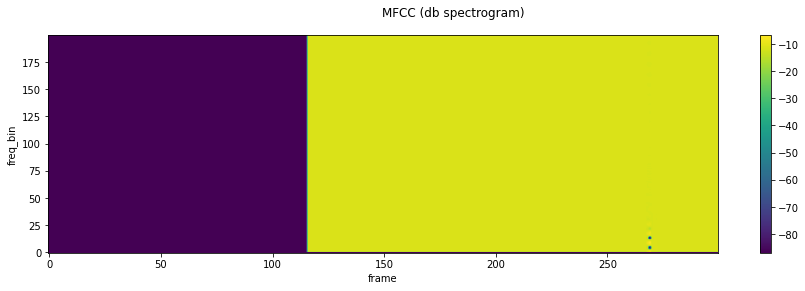

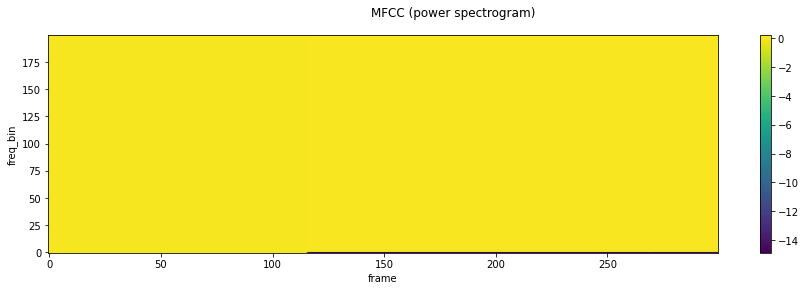

1

tensor(2.2979)

tensor(-14.8920)

tensor(-0.0039)

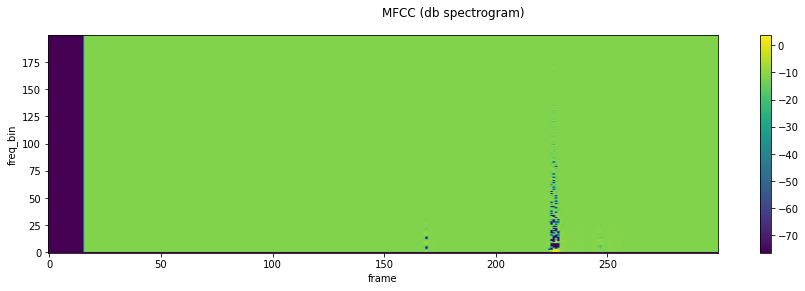

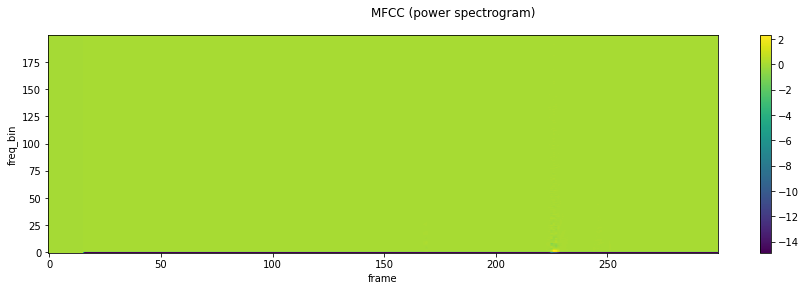

2

tensor(2.2979)

tensor(-14.8920)

tensor(-0.0041)

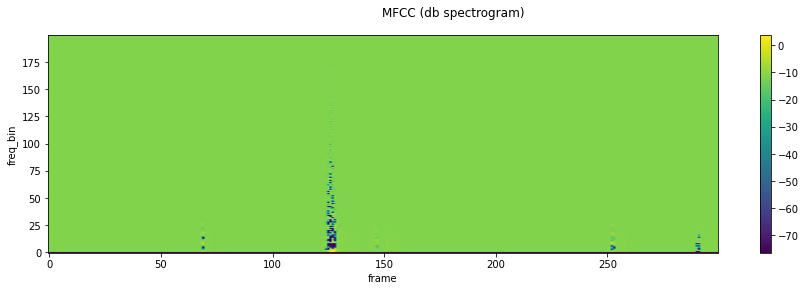

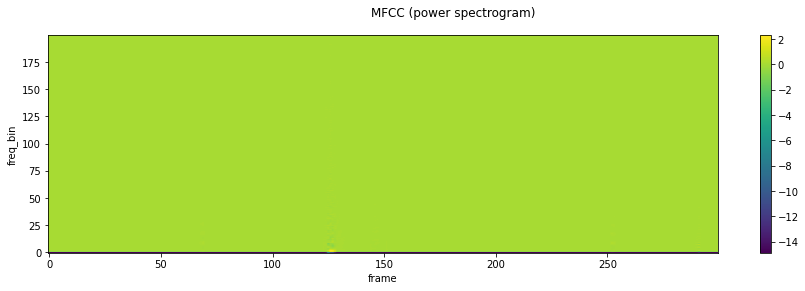

3

tensor(2.2979)

tensor(-14.8920)

tensor(-0.0037)

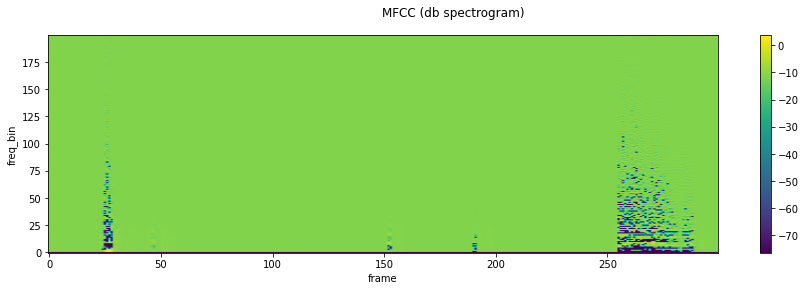

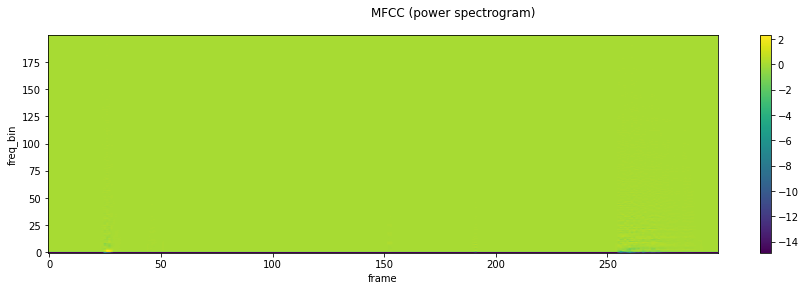

4

tensor(3.6092)

tensor(-14.8920)

tensor(0.0033)

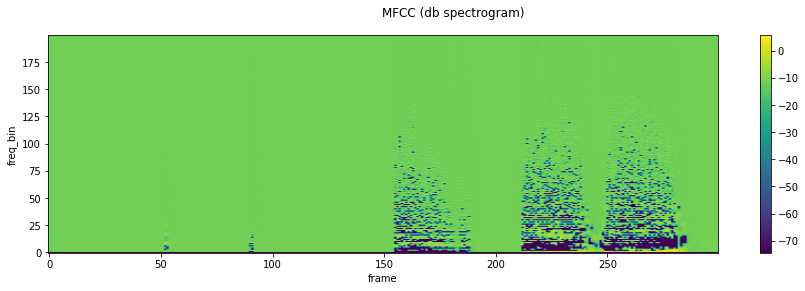

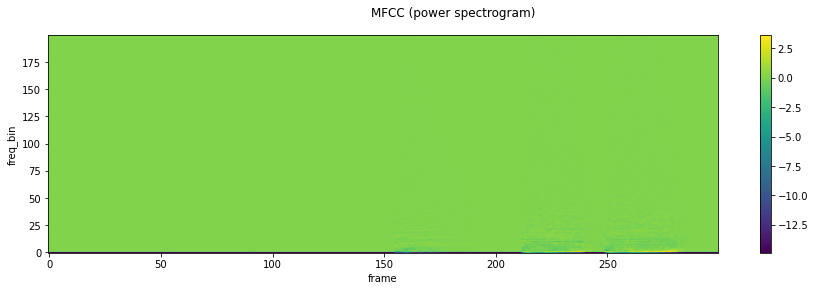

5

tensor(3.9081)

tensor(-14.8920)

tensor(0.0057)

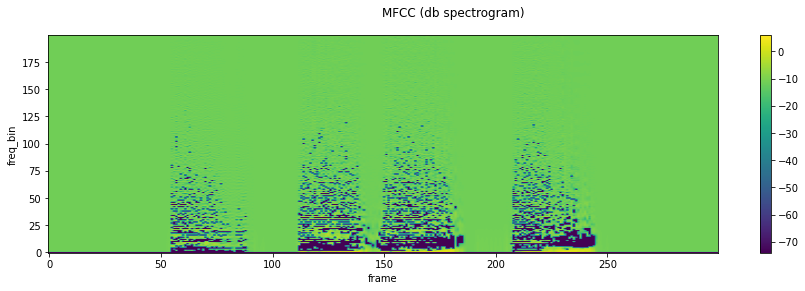

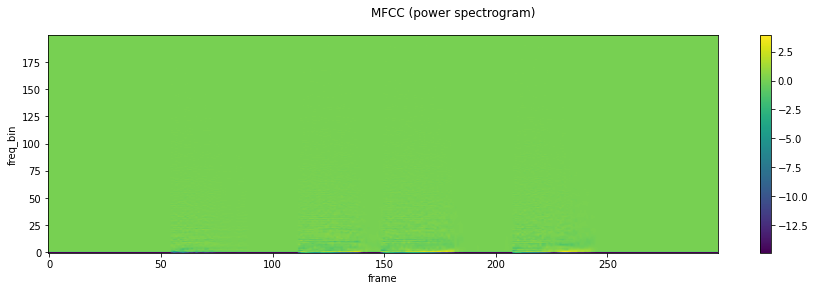

6

tensor(3.9081)

tensor(-14.8920)

tensor(0.0093)

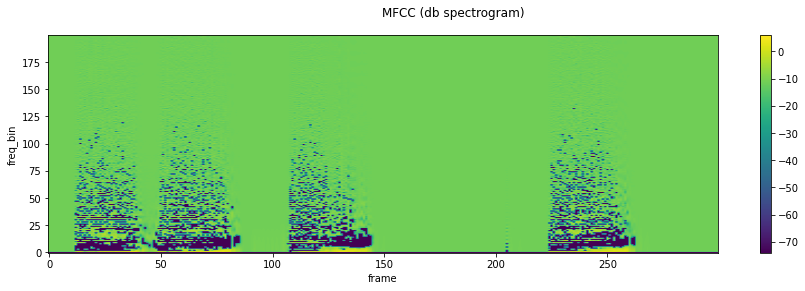

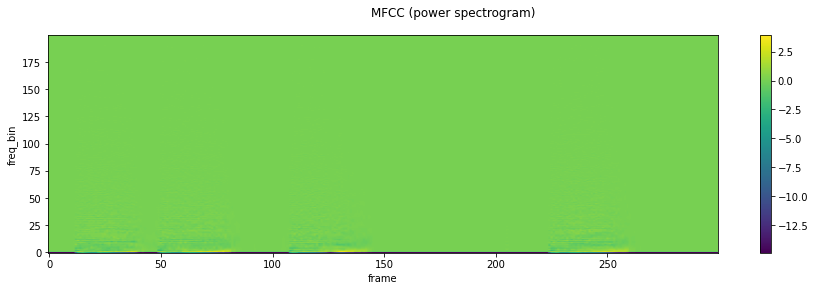

7

tensor(3.9081)

tensor(-14.8920)

tensor(0.0019)

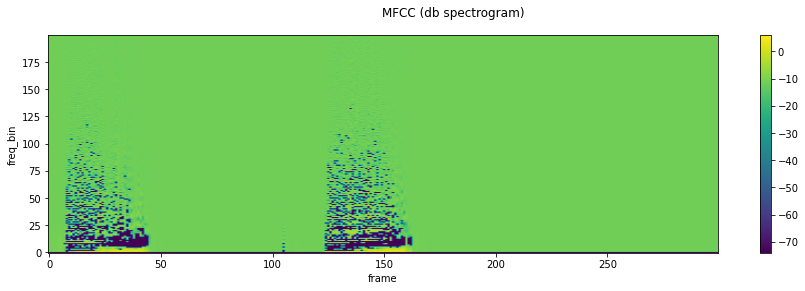

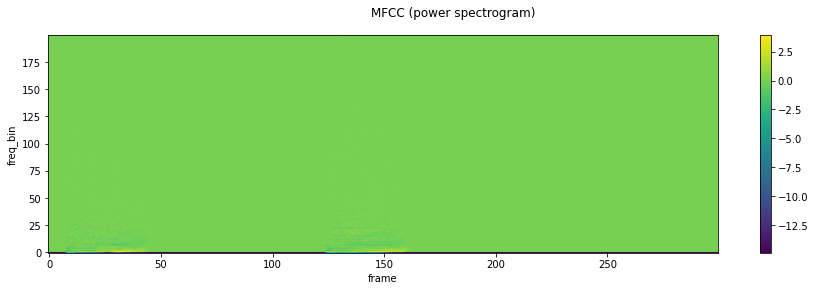

8

tensor(3.0651)

tensor(-14.8920)

tensor(-0.0004)

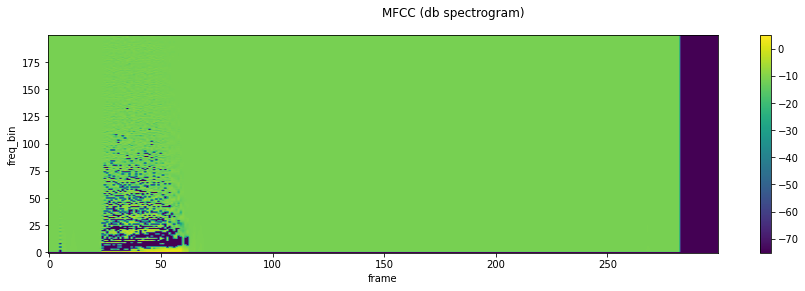

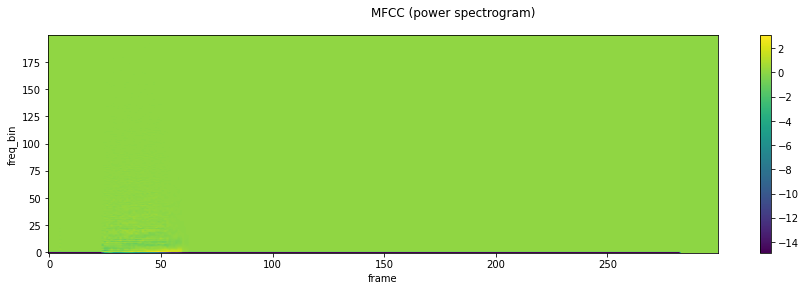

9

tensor(0.0772)

tensor(-14.8920)

tensor(-0.0028)

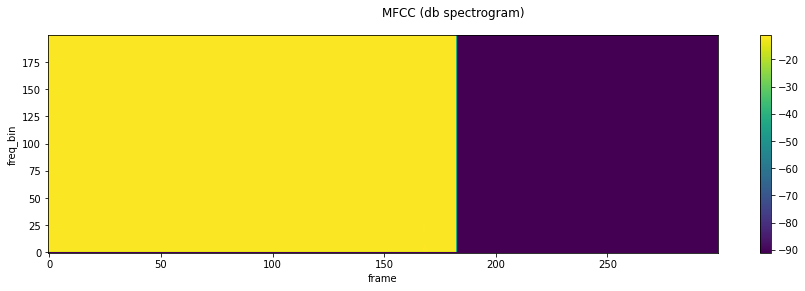

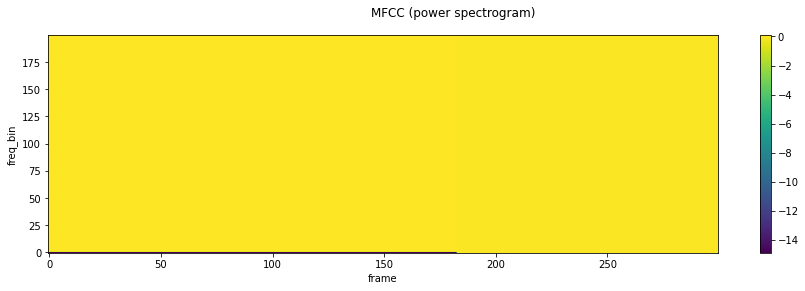

In [ ]:
for i in range(len(chunks)):
  display(i)
  display(chunks[i].max())
  display(chunks[i].min())
  display(chunks[i].mean())
  plot_spectrogram(chunks[i], title='MFCC (db spectrogram)')
  plot_spectrogram(chunks[i], title='MFCC (power spectrogram)', to_db=False)
  plt.show(block=False)

Tuy nhiên dễ dàng nhận thấy sẽ xuất hiện một số đoạn không âm, khi này nếu đoạn này lọt vào class 1 thì thật thảm họa! Do đó cần chiến lược loại bỏ các chunk này trong class 1.

Tổng hợp lại thành nn.Module

In [ ]:
class AudioChunking(torch.nn.Module):
    def __init__(self,
                 chunk_size: int=400,
                 chunk_step: int=200) -> None:
        super(AudioChunking, self).__init__()
        self.chunk_size = chunk_size
        self.chunk_step = chunk_step
        
    def forward(self, spec: torch.Tensor) -> torch.Tensor:
        _, _, spec_len = spec.shape
        pad_size = self.chunk_size - spec_len%self.chunk_size
        pad_size = (pad_size//2, pad_size//2+pad_size%2)
        padded_spec = torch.nn.functional.pad(spec, pad_size, mode='constant', value=0)
        chunks = padded_spec.unfold(-1, self.chunk_size, self.chunk_step).permute(2,0,1,3)
        return chunks

In [ ]:
chunking = AudioChunking(300, 100)
spec = mfcc_transform(sample_noCOVIDs[2]['wave'])
spec = (spec - spec.mean())/spec.std()
chunks = chunking(spec)
display(chunks.shape)

torch.Size([10, 1, 200, 300])

## SpecAug

Trong các augment kế tiếp, để nâng cao hiệu xuất, mình chỉ sử dụng các augment có thể dùng được trên mel spectrogram, cụ thể hơn là SpecAug.

Wave mẫu dùng để thử augmentation

In [ ]:
wave = sample_noCOVIDs[2]['wave']
spec = spectrogram(wave)
wave

tensor([[0., 0., 0.,  ..., 0., 0., 0.]])

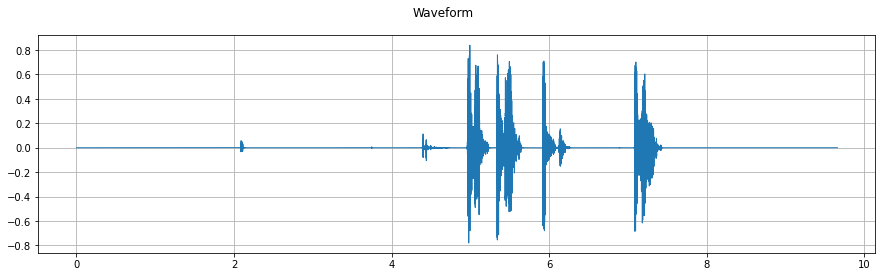

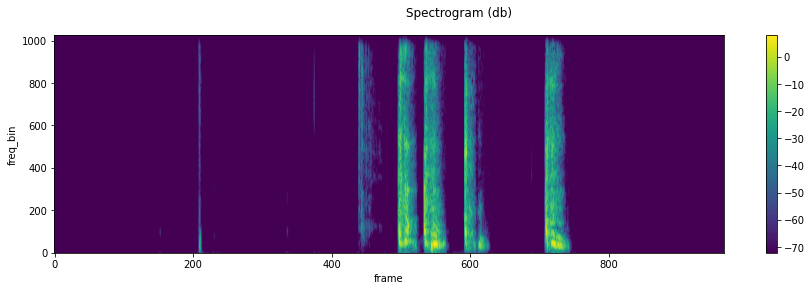

In [ ]:
play_audio(wave, 8000)
plot_waveform(wave, 8000)
plot_spectrogram(spec)

### Cài thư viện

spec_augment được implement bởi @zcaceres và cũng có sẵn trong torchaudio. Điểm mấu chốt ở đây là bạn @zcaceres có implement time warp (do warp không được hỗ trợ trực tiếp trong pytorch).

(hok xài của nó nữa)

In [ ]:
!git clone https://github.com/zcaceres/spec_augment.git
from spec_augment.exp.nb_SparseImageWarp import sparse_image_warp

Cloning into 'spec_augment'...
remote: Enumerating objects: 128, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 128 (delta 5), reused 15 (delta 4), pack-reused 109
Receiving objects: 100% (128/128), 29.41 MiB | 14.66 MiB/s, done.
Resolving deltas: 100% (54/54), done.


### Time/Freq warp, Time stretch
Theo như bench marking bên spec_augment, các thao tác liên quan tới warp đều có thời gian chạy gấp 1000 lần thao tác khác (hiển nhiên, vì mấy cái kia chi indexing thôi nên rất nhanh).

In [ ]:
# Các hàm cubic spline interpolate
# Src: https://stackoverflow.com/questions/61616810/how-to-do-cubic-spline-interpolation-and-integration-in-pytorch

def h_poly(t):
    tt = t[None, :]**torch.arange(4, device=t.device)[:, None]
    A = torch.tensor([
        [1, 0, -3, 2],
        [0, 1, -2, 1],
        [0, 0, 3, -2],
        [0, 0, -1, 1]
    ], dtype=t.dtype, device=t.device)
    return A @ tt


def interp(x, y, xs):
    m = (y[1:] - y[:-1]) / (x[1:] - x[:-1])
    m = torch.cat([m[[0]], (m[1:] + m[:-1]) / 2, m[[-1]]])
    idxs = torch.searchsorted(x[1:], xs)
    dx = (x[idxs + 1] - x[idxs])
    hh = h_poly((xs - x[idxs]) / dx)
    return hh[0] * y[idxs] + hh[1] * m[idxs] * dx + hh[2] * y[idxs + 1] + hh[3] * m[idxs + 1] * dx

`W` là hệ số warp.

Để warp cần phải có 2 giá trị: vị trí warp và khoảng cách warp.
- Vị trí warp sẽ random trong khoảng `[W, len - W]` (bỏ W ở 2 đầu để trành warp lố).
- Khoảng cách warp sẽ random trong khoảng `[-W, W]`.

In [ ]:
W = 50

# Lấy số hàng và cột của spec 
num_rows = spec.shape[-2]
spec_len = spec.shape[-1]

mid_y = num_rows//2
mid_x = spec_len//2

In [ ]:
warp_p = torch.randint(W, spec_len - W, (1,))
print("Warp point: ", warp_p)

# Uniform distribution from (0,W) with chance to be up to W negative
# warp_d = torch.randn(1)*W # Không dùng vì paper người ta dùng uniform distribution
warp_d = torch.randint(-W, W, (1,))
print("Warp distance: ", warp_d)

Warp point:  tensor([477])
Warp distance:  tensor([-11])


Tiến hành interpolate ra grid space bằng phương pháp cubic spline.

In [ ]:
# Tạo linspace 3 điểm, 2 điểm anchor và 1 điểm warp
x = torch.tensor([0, warp_p, spec_len-1])
y = torch.tensor([0,warp_p-warp_d, spec_len-1])
y = y*2/(spec_len-1) - 1 # Chuẩn hóa về [-1, 1]

# Interpolate lên theo kích thước spec
xs = torch.linspace(0, spec_len-1, spec_len)
ys = interp(x, y, xs)

Trực quan để hình dung được warp sẽ diễn ra mức độ như nào (warp không phải phép tuyến tính!)

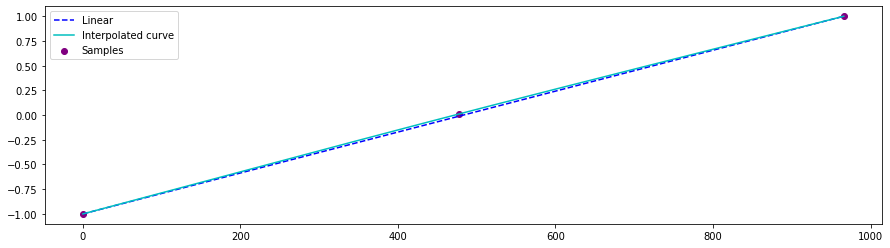

In [ ]:
plt.plot([0, spec_len-1], [-1, 1], 'b--', label='Linear')
plt.plot(xs, ys, 'c-', label='Interpolated curve')
plt.scatter(x, y, label='Samples', color='purple')
plt.legend()
plt.show()

Tạo flow grid kích thước (batch, height, width, 2). Chiều cuối cùng là x, y cho vị trí tương đối của pixel gốc.

In [ ]:
grid = torch.cat(
    (ys.view(1,1,-1,1).expand(1,num_rows,-1,1),
     torch.linspace(-1, 1, num_rows).view(1,-1,1,1).expand(1,-1,spec_len,1)), -1)
grid.shape

torch.Size([1, 1025, 967, 2])

Sử dụng `grid_sample` để warp.

In [ ]:
aug_spec = torch.nn.functional.grid_sample(spec.unsqueeze(0), grid, align_corners=True)[0]

So sánh trước và sau khi time warp, cũng như so sánh với spec_augment

In [ ]:
def time_warp(spec, W=100):
    num_rows = spec.shape[2]
    spec_len = spec.shape[1]
    device = spec.device

    # adapted from https://github.com/DemisEom/SpecAugment/
    pt = (num_rows - 2* W) * torch.rand([1], dtype=torch.float) + W # random point along the time axis
    print(pt)
    src_ctr_pt_freq = torch.arange(0, spec_len // 2)  # control points on freq-axis
    src_ctr_pt_time = torch.ones_like(src_ctr_pt_freq) * pt  # control points on time-axis
    src_ctr_pts = torch.stack((src_ctr_pt_freq, src_ctr_pt_time), dim=-1)
    src_ctr_pts = src_ctr_pts.float().to(device)

    # Destination
    w = 2 * W * torch.rand([1], dtype=torch.float) - W# distance
    print(w)
    dest_ctr_pt_freq = src_ctr_pt_freq
    dest_ctr_pt_time = src_ctr_pt_time + w
    dest_ctr_pts = torch.stack((dest_ctr_pt_freq, dest_ctr_pt_time), dim=-1)
    dest_ctr_pts = dest_ctr_pts.float().to(device)

    # warp
    source_control_point_locations = torch.unsqueeze(src_ctr_pts, 0)  # (1, v//2, 2)
    dest_control_point_locations = torch.unsqueeze(dest_ctr_pts, 0)  # (1, v//2, 2)
    warped_spectro, dense_flows = sparse_image_warp(spec, source_control_point_locations, dest_control_point_locations)
    return warped_spectro.squeeze(3)

In [ ]:
%%time
aug_by_spec_aug = time_warp(spec, 100)

tensor([409.1541])
tensor([46.9369])


/content/spec_augment/exp/nb_SparseImageWarp.py:113: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  X, LU = torch.solve(rhs, lhs)


CPU times: user 4.73 s, sys: 3.92 s, total: 8.65 s
Wall time: 8.64 s


In [ ]:
#@markdown My implementation
%%time
# Lấy số hàng và cột của spec 
num_rows = spec.shape[-2]
spec_len = spec.shape[-1]

mid_y = num_rows//2
mid_x = spec_len//2

warp_p = torch.tensor([195])
print("Warp point: ", warp_p)

# Uniform distribution from (0,W) with chance to be up to W negative
# warp_d = torch.randn(1)*W # Không dùng vì paper người ta dùng uniform distribution
warp_d = torch.tensor([82])
print("Warp distance: ", warp_d)

# Tạo linspace 3 điểm, 2 điểm anchor và 1 điểm warp
x = torch.tensor([0, warp_p, spec_len-1])
y = torch.tensor([0,warp_p-warp_d, spec_len-1])
y = y*2/(spec_len-1) - 1 # Chuẩn hóa về [-1, 1]

# Interpolate lên theo kích thước spec
xs = torch.linspace(0, spec_len-1, spec_len)
ys = interp(x, y, xs)
grid = torch.cat(
    (ys.view(1,1,-1,1).expand(1,num_rows,-1,1),
     torch.linspace(-1, 1, num_rows).view(1,-1,1,1).expand(1,-1,spec_len,1)), -1)
aug_spec = torch.nn.functional.grid_sample(spec.unsqueeze(0), grid, align_corners=True).squeeze(0)

Warp point:  tensor([195])
Warp distance:  tensor([82])
CPU times: user 24 ms, sys: 778 µs, total: 24.8 ms
Wall time: 21.6 ms


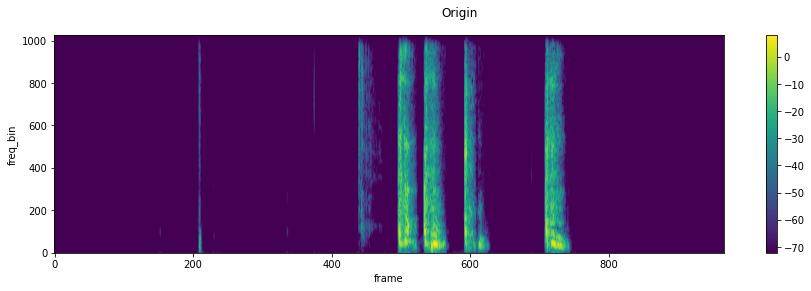

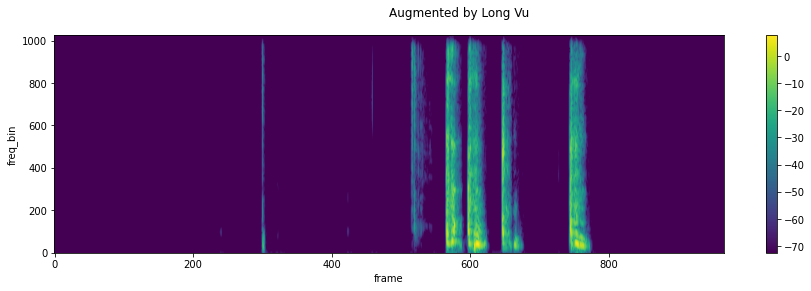

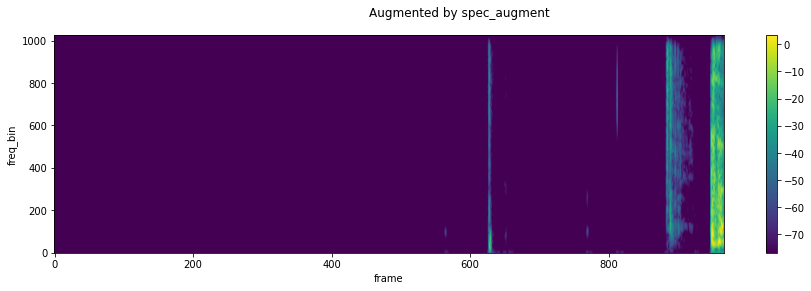

In [ ]:
plot_spectrogram(spec, title='Origin')
plot_spectrogram(aug_spec, title='Augmented by Long Vu')
plot_spectrogram(aug_by_spec_aug, title='Augmented by spec_augment')
play_audio_from_spec(aug_spec, 8000)

Tổng hợp thành hàm, hoạt động ngay cả theo batch.

In [ ]:
def _h_poly(t):
    tt = t.unsqueeze(-2)**torch.arange(4, device=t.device).view(-1,1)
    A = torch.tensor([
        [1, 0, -3, 2],
        [0, 1, -2, 1],
        [0, 0, 3, -2],
        [0, 0, -1, 1]
    ], dtype=t.dtype, device=t.device)
    return A @ tt


def _cspline_interpolate(x, y, xs):
    '''
    Input x and y must be of shape (batch, n) or (n)
    '''
    m = (y[..., 1:] - y[..., :-1]) / (x[..., 1:] - x[..., :-1])
    m = torch.cat([m[...,[0]], (m[...,1:] + m[...,:-1]) / 2, m[...,[-1]]], -1)
    idxs = torch.searchsorted(x[..., 1:], xs)
    dx = (x.take_along_dim(idxs+1, dim=-1) - x.take_along_dim(idxs, dim=-1))
    hh = _h_poly((xs - x.take_along_dim(idxs, dim=-1)) / dx)
    return hh[...,0,:] * y.take_along_dim(idxs, dim=-1) \
        + hh[...,1,:] * m.take_along_dim(idxs, dim=-1) * dx \
        + hh[...,2,:] * y.take_along_dim(idxs+1, dim=-1) \
        + hh[...,3,:] * m.take_along_dim(idxs+1, dim=-1) * dx

In [ ]:
def time_warp(specs, W=50):
  '''
  Time warp augmentation

  param:
    specs: spectrogram of size (batch, channel, freq_bin, length)
    W: strength of warp
  '''
  device = specs.device
  batch_size, _, num_freqs, spec_len = specs.shape

  warp_p = torch.randint(W, spec_len - W, (batch_size,), device=device)

  # Uniform distribution from (0,W) with chance to be up to W negative
  # warp_d = torch.randn(1)*W # Không dùng vì paper người ta dùng uniform distribution
  warp_d = torch.randint(-W, W, (batch_size,), device=device)
  src_control_points = torch.stack([torch.tensor([0], device=device).expand(batch_size),
                                    warp_p, torch.tensor([spec_len-1], device=device).expand(batch_size)], dim=1)
  dest_control_points = torch.stack([torch.tensor([-1.], device=device).expand(batch_size),
                                     (warp_p-warp_d)*2/(spec_len-1)-1, torch.tensor([1], device=device).expand(batch_size)], dim=1)

  # Interpolate lên theo kích thước spec
  src_frame_points = torch.linspace(0, spec_len-1, spec_len, device=device).unsqueeze(0).expand(batch_size, -1)
  dest_frame_points = _cspline_interpolate(src_control_points, dest_control_points, src_frame_points)

  grid = torch.cat(
      (dest_frame_points.view(batch_size,1,-1,1).expand(-1,num_freqs,-1,-1),
       torch.linspace(-1, 1, num_freqs, device=device).view(-1,1,1).expand(batch_size,-1,spec_len,-1)), dim=-1)

  return torch.nn.functional.grid_sample(specs, grid, align_corners=True)

In [ ]:
%%time
aug_spec = time_warp(spec.unsqueeze(0).expand(32,-1,-1,-1), 50)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: input value tensor is non-contiguous, this will lower the performance due to extra data copy when converting non-contiguous tensor to contiguous, please use contiguous input value tensor if possible (Triggered internally at  /pytorch/aten/src/ATen/native/BucketizationUtils.h:20.)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: input value tensor is non-contiguous, this will lower the performance due to extra data copy when converting non-contiguous tensor to contiguous, please use contiguous input value tensor if possible (Triggered internally at  /pytorch/aten/src/ATen/native/BucketizationUtils.h:25.)


CPU times: user 542 ms, sys: 2.2 ms, total: 544 ms
Wall time: 546 ms


0.5s cho warping trên 32 spectrogram gốc. Không tệ...

Tương tự cho frequency warping.

In [ ]:
def freq_warp(specs, W=50):
  '''
  Frequency warping augmentation

  param:
    specs: spectrogram of size (batch, channel, freq_bin, length)
    W: strength of warp
  '''
  device = specs.device
  batch_size, _, num_freqs, spec_len = specs.shape

  warp_p = torch.randint(W, num_freqs - W, (batch_size,), device=device)

  # Uniform distribution from (0,W) with chance to be up to W negative
  # warp_d = torch.randn(1)*W # Không dùng vì paper người ta dùng uniform distribution
  warp_d = torch.randint(-W, W, (batch_size,), device=device)
  
  print(f"Warp point: {warp_p}\nWarp distance: {warp_d}")
  
  src_control_points = torch.stack([torch.tensor([0], device=device).expand(batch_size),
                                    warp_p, torch.tensor([num_freqs-1], device=device).expand(batch_size)], dim=1)
  dest_control_points = torch.stack([torch.tensor([-1.], device=device).expand(batch_size),
                                     (warp_p-warp_d)*2/(num_freqs-1)-1, torch.tensor([1], device=device).expand(batch_size)], dim=1)

  # Interpolate lên theo kích thước spec
  src_freq_points = torch.linspace(0, num_freqs-1, num_freqs, device=device).unsqueeze(0).expand(batch_size, -1)
  dest_freq_points = _cspline_interpolate(src_control_points, dest_control_points, src_freq_points)

  grid = torch.cat(
      (torch.linspace(-1, 1, spec_len, device=device).view(-1,1).expand(batch_size,num_freqs,-1,-1),
      dest_freq_points.view(batch_size,-1,1,1).expand(-1,-1,spec_len,-1)), dim=-1)

  return torch.nn.functional.grid_sample(specs, grid, align_corners=True)

In [ ]:
%%time
aug_spec = freq_warp(spec.unsqueeze(0), 300)[0]

Warp point: tensor([624])
Warp distance: tensor([-210])
CPU times: user 26 ms, sys: 37.3 ms, total: 63.3 ms
Wall time: 62.8 ms


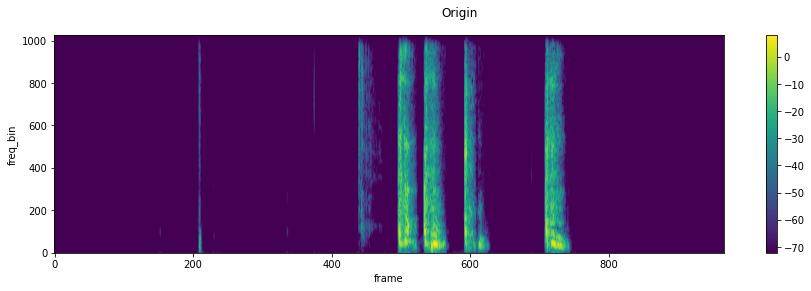

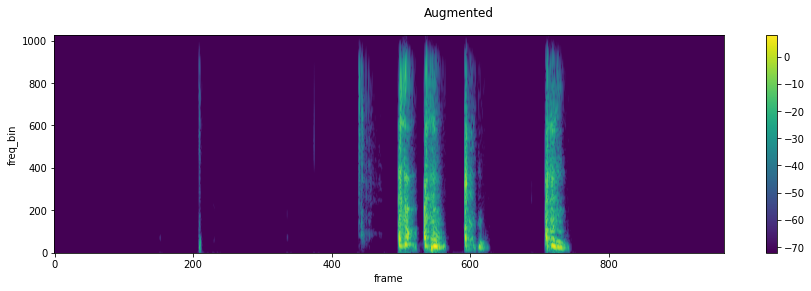

In [ ]:
plot_spectrogram(spec, title='Origin')
plot_spectrogram(aug_spec, title='Augmented')
play_audio_from_spec(aug_spec, 8000)

### Time masking

In [ ]:
masking = torchaudio.transforms.TimeMasking(time_mask_param=80)
aug_spec = masking(spec)

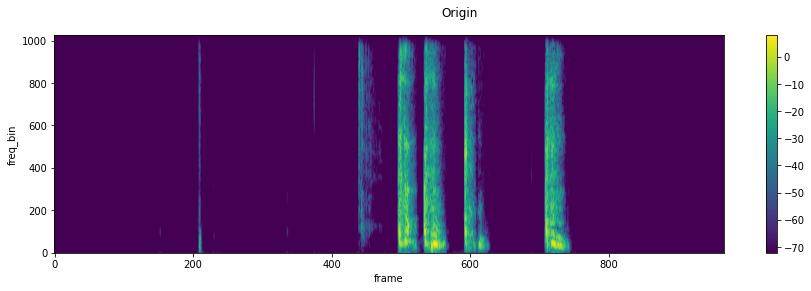

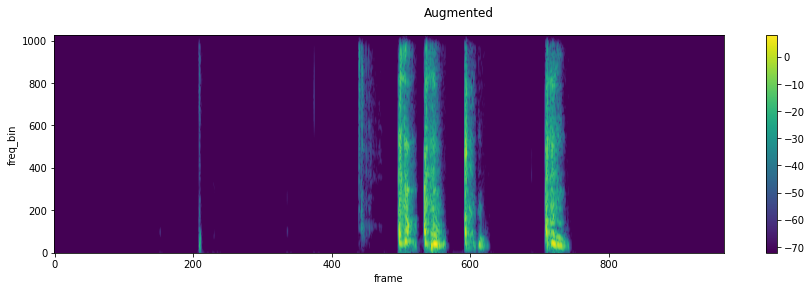

In [ ]:
plot_spectrogram(spec, title='Origin')
plot_spectrogram(aug_spec, title='Augmented')
play_audio_from_spec(aug_spec, 8000)

### Frequency masking (không tin tưởng lắm)

In [ ]:
masking = torchaudio.transforms.FrequencyMasking(freq_mask_param=80)
aug_spec = masking(spec)

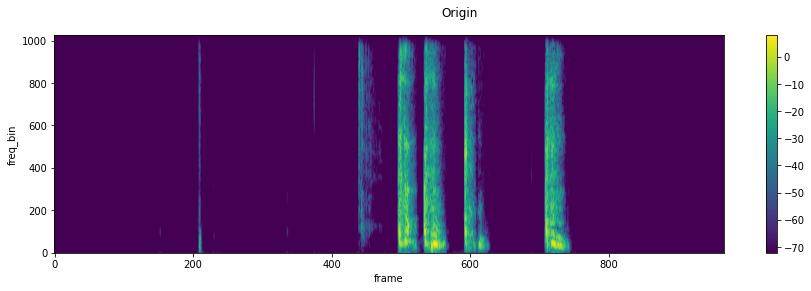

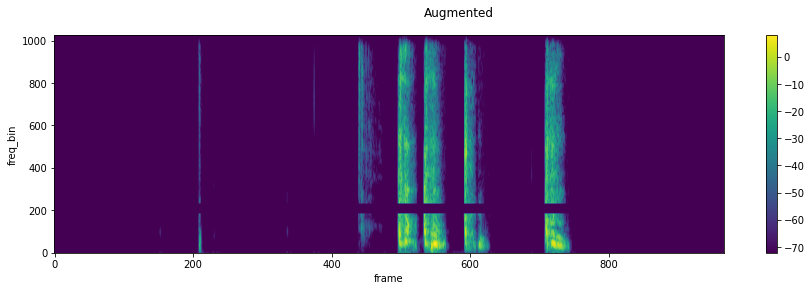

In [ ]:
plot_spectrogram(spec, title='Origin')
plot_spectrogram(aug_spec, title='Augmented')
play_audio_from_spec(aug_spec, 8000)

Tổng hợp lại thành nn.Module

In [ ]:
def _h_poly(t):
    tt = t.unsqueeze(-2)**torch.arange(4, device=t.device).view(-1,1)
    A = torch.tensor([
        [1, 0, -3, 2],
        [0, 1, -2, 1],
        [0, 0, 3, -2],
        [0, 0, -1, 1]
    ], dtype=t.dtype, device=t.device)
    return A @ tt


def _cspline_interpolate(x, y, xs):
    '''
    Input x and y must be of shape (batch, n) or (n)
    '''
    m = (y[..., 1:] - y[..., :-1]) / (x[..., 1:] - x[..., :-1])
    m = torch.cat([m[...,[0]], (m[...,1:] + m[...,:-1]) / 2, m[...,[-1]]], -1)
    idxs = torch.searchsorted(x[..., 1:], xs)
    dx = (x.take_along_dim(idxs+1, dim=-1) - x.take_along_dim(idxs, dim=-1))
    hh = _h_poly((xs - x.take_along_dim(idxs, dim=-1)) / dx)
    return hh[...,0,:] * y.take_along_dim(idxs, dim=-1) \
        + hh[...,1,:] * m.take_along_dim(idxs, dim=-1) * dx \
        + hh[...,2,:] * y.take_along_dim(idxs+1, dim=-1) \
        + hh[...,3,:] * m.take_along_dim(idxs+1, dim=-1) * dx
        

class SpecAugment(torch.nn.Module):
  def __init__(
      self,
      time_W: int = 50,
      freq_W: int = 50,
      T: int = 80,
      F: int = 80,
      mT: int = 1,
      mF: int = 1
  ) -> None:
      super(SpecAugment, self).__init__()
      self.time_W = time_W
      self.freq_W = freq_W
      if time_W==0 and freq_W==0:
          self.cum_warping = lambda x: x
      elif time_W!=0 and freq_W==0:
          self.cum_warping = self.time_warping
      elif time_W==0 and freq_W!=0:
          self.cum_warping = self.freq_warping
      else:
          self.cum_warping = self.time_freq_warping
      self.time_masking = torchaudio.transforms.TimeMasking(time_mask_param=T)
      self.freq_masking = torchaudio.transforms.FrequencyMasking(freq_mask_param=F)


  def _get_warping_flow(self,
                        warp_p: torch.Tensor,
                        warp_d: torch.Tensor,
                        interp_len: int) -> torch.Tensor:
      '''
      Get interpolated flow
      Warning: This function doesn't check for batch size match between warp_p and warp_d
      '''
      device = warp_p.device
      batch_size = warp_p.shape[0]

      src_control_points = torch.stack([torch.tensor([0], device=device).expand(batch_size),
                                        warp_p, torch.tensor([interp_len-1], device=device).expand(batch_size)], dim=1)
      dest_control_points = torch.stack([torch.tensor([-1.], device=device).expand(batch_size),
                                        (warp_p-warp_d)*2/(interp_len-1)-1, torch.tensor([1], device=device).expand(batch_size)], dim=1)

      # Interpolate from 3 points to interp_len points
      src_interp_points = torch.linspace(0, interp_len-1, interp_len, device=device).unsqueeze(0).expand(batch_size, -1)
      dest_interp_points = _cspline_interpolate(src_control_points, dest_control_points, src_interp_points)

      return dest_interp_points


  def freq_warping(self, specs: torch.Tensor) -> torch.Tensor:
      '''
      Frequency warping augmentation, only return interpolated flow

      param:
        specs: spectrogram of size (batch, channel, freq_bin, length)
      '''
      W = self.freq_W
      device = specs.device
      batch_size, _, num_freqs, num_frames = specs.shape

      warp_p = torch.randint(W, num_freqs - W, (batch_size,), device=device)

      # Uniform distribution from (0,W) with chance to be up to W negative
      warp_d = torch.randint(-W, W, (batch_size,), device=device)
      
      dest_freq_points = self._get_warping_flow(warp_p, warp_d, num_freqs)
      dest_frame_points = torch.linspace(-1, 1, num_frames, device=device)

      grid = torch.cat(
          (dest_frame_points.view(-1,1).expand(batch_size,num_freqs,-1,-1),
          dest_freq_points.view(batch_size,-1,1,1).expand(-1,-1,num_frames,-1)), dim=-1)

      return torch.nn.functional.grid_sample(specs, grid, align_corners=True)


  def time_warping(self, specs: torch.Tensor) -> torch.Tensor:
      '''
      Time warping augmentation, only return interpolated flow

      param:
        specs: spectrogram of size (batch, channel, freq_bin, length)
      '''
      W = self.time_W
      device = specs.device
      batch_size, _, num_freqs, num_frames = specs.shape

      warp_p = torch.randint(W, num_frames - W, (batch_size,), device=device)

      # Uniform distribution from (0,W) with chance to be up to W negative
      warp_d = torch.randint(-W, W, (batch_size,), device=device)

      # Interpolate from 3 points to num_frames points
      dest_frame_points = self._get_warping_flow(warp_p, warp_d, num_frames)
      dest_freq_points = torch.linspace(-1, 1, num_freqs, device=device)

      grid = torch.cat(
          (dest_frame_points.view(batch_size,1,-1,1).expand(-1,num_freqs,-1,-1),
          dest_freq_points.view(-1,1,1).expand(batch_size,-1,num_frames,-1)), dim=-1)

      return torch.nn.functional.grid_sample(specs, grid, align_corners=True)


  def time_freq_warping(self,specs: torch.Tensor) -> torch.Tensor:
      '''
      Doing both time warping and frequency warping augmentation

      param:
        specs: spectrogram of size (batch, channel, freq_bin, length)
        W: strength of warp
      '''
      device = specs.device
      batch_size, _, num_freqs, num_frames = specs.shape

      time_warp_p = torch.randint(self.time_W, num_frames - self.time_W, (batch_size,), device=device)
      freq_warp_p = torch.randint(self.freq_W, num_freqs - self.freq_W, (batch_size,), device=device)

      # Uniform distribution from (0,W) with chance to be up to W negative
      time_warp_d = torch.randint(-self.time_W, self.time_W, (batch_size,), device=device)
      freq_warp_d = torch.randint(-self.freq_W, self.freq_W, (batch_size,), device=device)

      # Interpolate lên theo kích thước spec
      dest_freq_points = self._get_warping_flow(freq_warp_p, freq_warp_d, num_freqs)
      dest_frame_points = self._get_warping_flow(time_warp_p, time_warp_d, num_frames)

      grid = torch.cat(
          (dest_frame_points.view(batch_size,1,-1,1).expand(-1,num_freqs,-1,-1),
          dest_freq_points.view(batch_size,-1,1,1).expand(-1,-1,num_frames,-1)), dim=-1)

      return torch.nn.functional.grid_sample(specs, grid, align_corners=True)


  def forward(self, specs: torch.Tensor) -> torch.Tensor:
      aug_specs = self.cum_warping(specs)
      aug_specs = self.time_masking(aug_specs)
      aug_specs = self.freq_masking(aug_specs)
      return aug_specs

In [ ]:
specaug = SpecAugment()
aug_spec = specaug(spec.unsqueeze(0))[0]

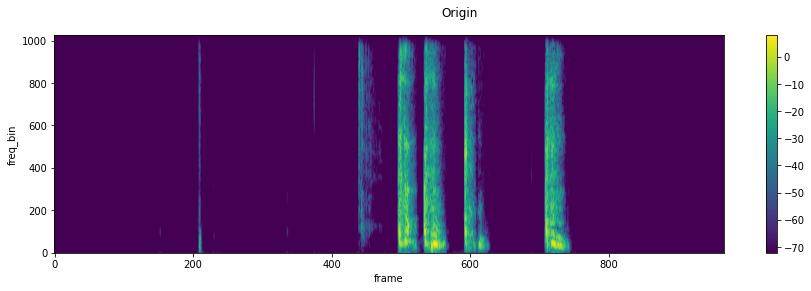

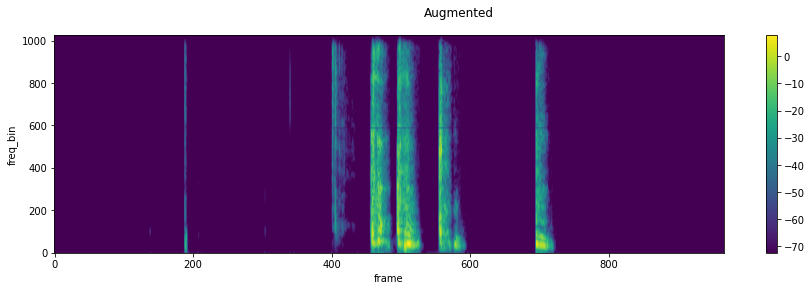

In [ ]:
plot_spectrogram(spec, title='Origin')
plot_spectrogram(aug_spec, title='Augmented')
play_audio_from_spec(aug_spec, 8000)

## Noise injection
Noise injection ở đây chỉ thực hiện được trên waveform, nên chỉ giới hạn dùng lúc đầu để nâng số lượng mẫu lên, không dùng augment trong lúc train được.

### Simulating a phone recoding
Source: https://pytorch.org/tutorials/beginner/audio_preprocessing_tutorial.html#simulating-a-phone-recoding

In [ ]:
#@markdown Tải noise audio
import requests

!mkdir _sample_data
SAMPLE_NOISE_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/distractors/rm1/babb/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo.wav"
SAMPLE_NOISE_PATH = os.path.join('_sample_data', "bg.wav")
SAMPLE_RIR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/room-response/rm1/impulse/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo.wav"
SAMPLE_RIR_PATH = os.path.join('_sample_data', "rir.wav")

def _fetch_data():
  uri = [
    (SAMPLE_NOISE_URL, SAMPLE_NOISE_PATH),
    (SAMPLE_RIR_URL, SAMPLE_RIR_PATH)
  ]
  for url, path in uri:
    with open(path, 'wb') as file_:
      file_.write(requests.get(url).content)

_fetch_data()

In [ ]:
def _get_sample(path, resample=None):
  effects = [
    ["remix", "1"]
  ]
  if resample:
    effects.extend([
      ["lowpass", f"{resample // 2}"],
      ["rate", f'{resample}'],
    ])
  return torchaudio.sox_effects.apply_effects_file(path, effects=effects)

def get_noise_sample(*, resample=None):
  return _get_sample(SAMPLE_NOISE_PATH, resample=resample)

def get_rir_sample(*, resample=None, processed=False):
  rir_raw, sample_rate = _get_sample(SAMPLE_RIR_PATH, resample=resample)
  if not processed:
    return rir_raw, sample_rate
  rir = rir_raw[:, int(sample_rate*1.01):int(sample_rate*1.3)]
  rir = rir / torch.norm(rir, p=2)
  rir = torch.flip(rir, [1])
  return rir, sample_rate

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


torch.Size([1, 78720])

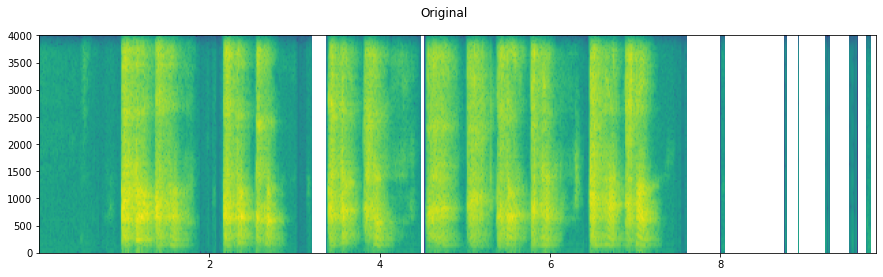

In [ ]:
speech = sample_COVIDs[0]['wave']
plot_specgram(speech, 8000, title="Original")
play_audio(speech, 8000)
speech.shape

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


torch.Size([1, 78720])

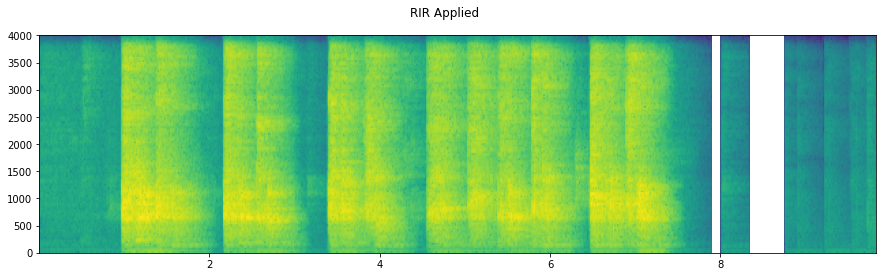

In [ ]:
# Apply RIR
rir, _ = get_rir_sample(resample=8000, processed=True)
speech_ = torch.nn.functional.pad(speech, (rir.shape[1]-1, 0))
speech = torch.nn.functional.conv1d(speech_[None, ...], rir[None, ...])[0]

plot_specgram(speech, 8000, title="RIR Applied")
play_audio(speech, 8000)
speech.shape

torch.Size([1, 78720])

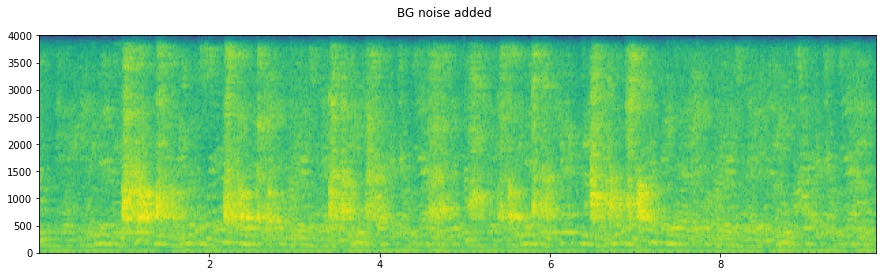

In [ ]:
import math

# Add background noise
# Because the noise is recorded in the actual environment, we consider that
# the noise contains the acoustic feature of the environment. Therefore, we add
# the noise after RIR application.
noise, _ = get_noise_sample(resample=8000)
noise = noise.repeat(1, 1 + speech.shape[1] // noise.shape[1])
noise = noise[:, :speech.shape[1]]

snr_db = 8
scale = math.exp(snr_db / 10) * noise.norm(p=2) / speech.norm(p=2)
speech = (scale * speech + noise) / 2

plot_specgram(speech, 8000, title="BG noise added")
play_audio(speech, 8000)
speech.shape

torch.Size([1, 78720])

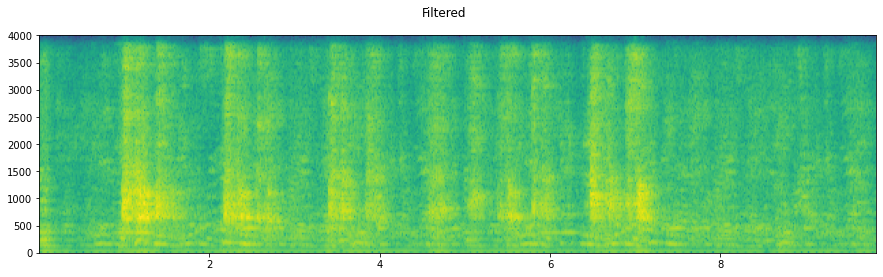

In [ ]:
# Apply filtering and change sample rate
speech, sample_rate = torchaudio.sox_effects.apply_effects_tensor(
  speech,
  8000,
  effects=[
      ["lowpass", "4000"],
      ["compand", "0.02,0.05", "-60,-60,-30,-10,-20,-8,-5,-8,-2,-8", "-8", "-7", "0.05"]
  ],
)

plot_specgram(speech, 8000, title="Filtered")
play_audio(speech, 8000)
speech.shape

torch.Size([1, 78720])

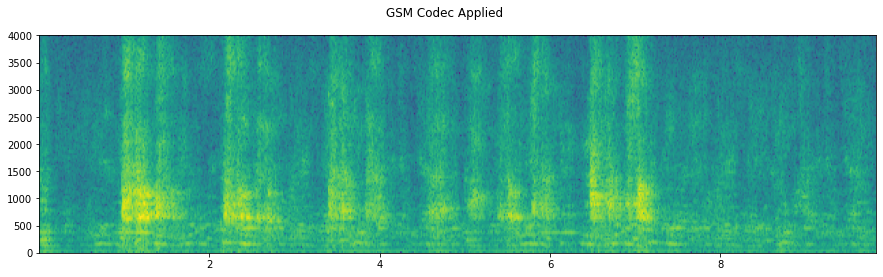

In [ ]:
# Apply telephony codec
speech = torchaudio.functional.apply_codec(speech, 8000, format="gsm")

plot_specgram(speech, 8000, title="GSM Codec Applied")
play_audio(speech, 8000)
speech.shape

Gom lại thành nn.Module

In [ ]:
import math

class RoomReverb(torch.nn.Module):
    def __init__(self, rir_list):
        super(RoomReverb, self).__init__()
        self.rirs = rir_list

    def _get_rir(self):
        if type(self.rirs) is list:
            return random.choice(self.rirs)
        else: 
            return next(self.rirs)

    def forward(self, wave: torch.Tensor):
        rir = self._get_rir()
        _wave = torch.nn.functional.pad(wave, (rir.shape[-1]-1, 0))
        _wave = torch.nn.functional.conv1d(_wave[None, ...], rir[None, ...])[0]
        return _wave


class NoiseInject(torch.nn.Module):
    def __init__(self, noise_list, snr_db):
        super(NoiseInject, self).__init__()
        self.noises = noise_list
        self.snr_db = snr_db

    def _get_noise(self):
        if type(self.noises) is list:
            return random.choice(self.noises)
        else: 
            return next(self.noises)

    def forward(self, wave: torch.Tensor):
        noise = self._get_noise()
        _noise = noise.repeat(1, 1 + wave.shape[-1] // noise.shape[-1])[..., :wave.shape[-1]]
        scale = math.exp(self.snr_db / 10) * _noise.norm(p=2) / wave.norm(p=2)
        _wave = (scale * wave + _noise) / 2
        return _wave


class PhoneSim(torch.nn.Module):
    def __init__(self):
        super(PhoneSim, self).__init__()

    def forward(self, wave: torch.Tensor):
        device = wave.device
        _wave = wave.cpu()
        _wave, _ = torchaudio.sox_effects.apply_effects_tensor(
          _wave, 8000,
          effects=[["lowpass", "4000"],
                   ["compand", "0.02,0.05", "-60,-60,-30,-10,-20,-8,-5,-8,-2,-8", "-8", "-7", "0.05"]]
        )
        _wave = torchaudio.functional.apply_codec(_wave, 8000, format="gsm")
        return _wave.to(device)


audio_transform = torch.nn.Sequential()
audio_transform.add_module("reverb", RoomReverb([rir]))
audio_transform.add_module("noise_inj", NoiseInject([noise], 8))
audio_transform.add_module("phone_sim", PhoneSim())

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


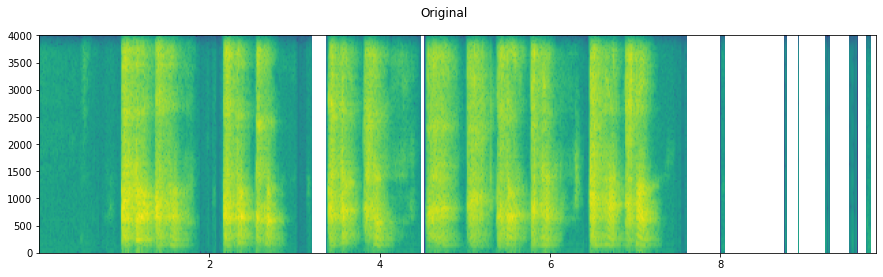

torch.Size([1, 78720])

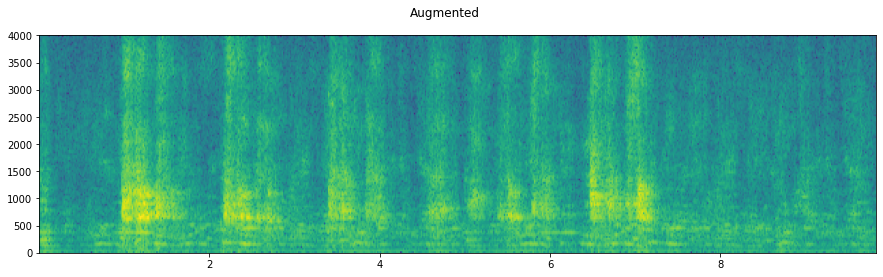

In [ ]:
audio = sample_COVIDs[0]['wave']
plot_specgram(audio, 8000, title="Original")
play_audio(audio, 8000)
plt.show(block=False)

aug_aud = audio_transform(audio)
plot_specgram(aug_aud, 8000, title="Augmented")
play_audio(aug_aud, 8000)
aug_aud.shape

# Đọc chuẩn bị dataset

## Validation split

In [ ]:
from sklearn.model_selection import train_test_split

idx_train, idx_val = train_test_split(train_meta.index,train_size=val_split)

val_meta = train_meta.iloc[idx_val]
train_meta = train_meta.iloc[idx_train]

In [ ]:
len(val_meta)

240

In [ ]:
len(train_meta)

959

## Lazy loading dataset (không dùng...)

In [ ]:
class AICOVIDDataset(Dataset):
    def __init__(self, meta_df, audio_transform=None):
        try:
          self.labels = meta_df['assessment_result'].values
        except KeyError:
          self.labels = None
        self.file_dir = meta_df['file_path'].values
        self.ids = meta_df['uuid'].values
        self.genders = meta_df['subject_gender'].values
        self.ages = meta_df['subject_age'].values
        self.transform = audio_transform

    def __len__(self):
        return len(self.file_dir)

    def __getitem__(self, idx):
        wave = read_resample_audio(self.file_dir[idx])
        label = torch.tensor(self.labels[idx]) if self.labels is not None else None
        id = self.ids[idx]
        gender = self.genders[idx]
        age = self.ages[idx]

        if self.transform:
            wave = self.transform(wave)
        
        return wave, label, id, gender, age

## Đọc hết lên RAM

## Benchmark

In [ ]:
file = train_meta['file_path'].iloc[0]

### CPU

In [ ]:
# Đọc, nhân bản và rút trích mel spectrogram
basic_transform = torch.nn.Sequential(mel_spectrogram,
                                      log_spectrogram,
                                      MinMaxScaler())
transform0 = torch.nn.Sequential(basic_transform).cpu()
transform1 = torch.nn.Sequential(NoiseInject([noise], 8)).cpu()
transform2 = torch.nn.Sequential(NoiseInject([noise], 16)).cpu()
transform3 = torch.nn.Sequential(RoomReverb([rir]), 
                                 NoiseInject([noise], 8), 
                                 PhoneSim()).cpu()

chunking = AudioChunking(400, 200)

def read_spec_audio(file):
  wave = read_resample_audio(file, 8000)
  specs = [transform0(wave),
          transform1(wave),
          transform2(wave),
          transform3(wave)]
  return specs

In [ ]:
%%timeit
wave = read_resample_audio(file, 8000)

The slowest run took 10.90 times longer than the fastest. This could mean that an intermediate result is being cached.
1000 loops, best of 5: 785 µs per loop


In [ ]:
wave = read_resample_audio(file, 8000)

In [ ]:
%%timeit
transform0(wave)

10 loops, best of 5: 21.4 ms per loop


In [ ]:
%%timeit
transform1(wave)

1000 loops, best of 5: 695 µs per loop


In [ ]:
%%timeit
transform2(wave)

1000 loops, best of 5: 689 µs per loop


In [ ]:
%%timeit
transform3(wave)

10 loops, best of 5: 151 ms per loop


In [ ]:
%%timeit
wave = read_spec_audio(file)

10 loops, best of 5: 176 ms per loop


In [ ]:
spec = transform0(wave)

In [ ]:
%%timeit
chunking(spec)

1000 loops, best of 5: 396 µs per loop


### GPU

In [ ]:
# Đọc, nhân bản và rút trích mel spectrogram
basic_transform = torch.nn.Sequential(mel_spectrogram,
                                      log_spectrogram,
                                      MinMaxScaler())
transform0 = torch.nn.Sequential(basic_transform).cuda()
transform1 = torch.nn.Sequential(NoiseInject([noise.cuda()], 8)).cuda()
transform2 = torch.nn.Sequential(NoiseInject([noise.cuda()], 16)).cuda()
transform3 = torch.nn.Sequential(RoomReverb([rir.cuda()]), 
                                 NoiseInject([noise.cuda()], 8), 
                                 PhoneSim()).cuda()

def read_spec_audio(file):
  wave = read_resample_audio(file, 8000).cuda()
  specs = [transform0(wave),
          transform1(wave),
          transform2(wave),
          transform3(wave)]
  return specs

In [ ]:
%%timeit
wave = read_resample_audio(file, 8000).cuda()

1000 loops, best of 5: 921 µs per loop


In [ ]:
wave = read_resample_audio(file, 8000).cuda()

In [ ]:
%%timeit
transform0(wave)

The slowest run took 72.04 times longer than the fastest. This could mean that an intermediate result is being cached.
1000 loops, best of 5: 1.85 ms per loop


In [ ]:
%%timeit
transform1(wave)

The slowest run took 25.90 times longer than the fastest. This could mean that an intermediate result is being cached.
1000 loops, best of 5: 207 µs per loop


In [ ]:
%%timeit
transform2(wave)

The slowest run took 24.65 times longer than the fastest. This could mean that an intermediate result is being cached.
1000 loops, best of 5: 207 µs per loop


In [ ]:
%%timeit
transform3(wave)

10 loops, best of 5: 48.7 ms per loop


In [ ]:
%%timeit
wave = read_spec_audio(file)

10 loops, best of 5: 54.2 ms per loop


In [ ]:
spec = transform0(wave)

In [ ]:
%%timeit
chunking(spec)

The slowest run took 10.63 times longer than the fastest. This could mean that an intermediate result is being cached.
10000 loops, best of 5: 55.3 µs per loop


## Đọc toàn bộ

In [ ]:
# Đọc, nhân bản và rút trích mel spectrogram
basic_transform = torch.nn.Sequential(mel_spectrogram,
                                      log_spectrogram,
                                      MinMaxScaler())
transform0 = torch.nn.Sequential(basic_transform).cuda()
transform1 = torch.nn.Sequential(NoiseInject([noise.cuda()], 8),
                                 basic_transform).cuda()
transform2 = torch.nn.Sequential(NoiseInject([noise.cuda()], 16),
                                 basic_transform).cuda()
transform3 = torch.nn.Sequential(RoomReverb([rir.cuda()]), 
                                 NoiseInject([noise.cuda()], 8), 
                                 PhoneSim(),
                                 basic_transform).cuda()

def read_spec_audio(file):
  wave = read_resample_audio(file, 8000).cuda()
  specs = [transform0(wave),
          transform1(wave),
          transform2(wave),
          transform3(wave)]
  return specs

In [ ]:
# Đọc hết toàn bộ train audio
%%time
_specs = []
labels = train_meta['assessment_result'].to_list()
max_len = 0
for file in train_meta['file_path']:
  specs = read_spec_audio(file)
  max_len = max(max_len, specs[0].size()[-1])
  _specs += specs

print(f"Maximum audio length in train set: {max_len}")

Maximum audio length in train set: 8899
CPU times: user 36.7 s, sys: 428 ms, total: 37.1 s
Wall time: 37.1 s


Đưa thành Dataset

In [ ]:
class AICOVIDDataset(Dataset):
    def __init__(self, meta_df, audio_transforms: torch.nn.ModuleList):
        self.meta_df = meta_df
        self.transforms = audio_transforms
        self.specs = []
        self.idxs = []  # Cause 1 audio can be duplicated up to 4 by using 4 difference transformations
                        # so we need index array use to query info from dataframe

        for id, file in enumerate(self.meta_df['file_path']):
            specs = self._read_spec_audio(file)
            self.specs += specs
            self.idxs += [id]*len(specs)
        
    def _read_spec_audio(self, file):
        wave = read_resample_audio(file, 8000).cuda()
        specs = [trans(wave) for trans in self.transforms]
        return specs

    def __len__(self):
        return len(self.specs)

    def __getitem__(self, idx):
        spec = self.specs[idx]
        meta = self.meta_df.iloc[self.idxs[idx]]
        try:
            label = torch.tensor(meta['assessment_result'])
        except KeyError:
            label = None
        id = meta['uuid']
        gender = meta['subject_gender']
        age = meta['subject_age']

        return spec, label, id, gender, age

Gom lại thành Dataset

In [ ]:
train_set = AICOVIDDataset(train_meta, torch.nn.ModuleList([transform0,transform1,transform2,transform3]))
val_set = AICOVIDDataset(val_meta, torch.nn.ModuleList([transform0]))
test_set = AICOVIDDataset(test_meta, torch.nn.ModuleList([transform0]))

In [ ]:
# TEST DATASET
train_set[0]

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0029, 0.0101, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],
        device='cuda:0'),
 tensor(0),
 '1b7d4b40-ca00-4a25-bb02-805fb3dda110',
 nan,
 nan)

# Collate function

In [ ]:
chunking = AudioChunking(400, 200)

# def overlap_chunking(tensor, chunk_size, chunk_step):
#   # Chunk_num x MFCC_features x chunk_size
#   chunks = tensor.unfold(1, chunk_size, chunk_step).permute(1,0,2)
#   return chunks[ torch.amax(chunks, dim=[1,2]) > 1.7 ]

def collate_fn(batch):
    # A data tuple has the form:
    # spec, label

    specs, labels = [], []

    # Gather in lists, and encode labels as indices
    for spec, label, _, _, _ in batch:
        chunks = chunking(spec)
        specs += [chunks]
        labels += [label]*chunks.size()[0]

    # Group the list of tensors into a batched tensor
    specs = torch.cat(specs)
    try:
      labels = torch.stack(labels)
      return specs, labels
    except:
      return specs

In [ ]:
from torch.nn.utils.rnn import pad_sequence

def collate_no_chunking_fn(batch):
    # A data tuple has the form:
    # spec, label

    specs, labels = [], []

    # Gather in lists, and encode labels as indices
    for spec, label, _, _, _ in batch:
        specs += [spec.permute(2,0,1)]
        labels += [label]

    # Group the list of tensors into a batched tensor
    specs = pad_sequence(specs, batch_first=True).permute(0,2,3,1)
    try:
      labels = torch.stack(labels)
      return specs, labels
    except:
      return specs

In [ ]:
batch_size = 16

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device == "cuda":
    num_workers = 2
    pin_memory = True
else:
    num_workers = 0
    pin_memory = False

In [ ]:
train_loader = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=num_workers,
    pin_memory=pin_memory,
)

val_loader = torch.utils.data.DataLoader(
    val_set,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_no_chunking_fn,
    num_workers=num_workers,
    pin_memory=pin_memory,
)

test_loader = torch.utils.data.DataLoader(
    test_set,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_no_chunking_fn,
    num_workers=num_workers,
    pin_memory=pin_memory,
)

# Benchmarking Dataloader

In [ ]:
%%time
s=0
i=0
for t in train_loader:
  s+=t[0].size()[0]
  i+=1
display(s)
display(i)

14668

240

CPU times: user 790 ms, sys: 9.07 ms, total: 799 ms
Wall time: 797 ms
